In [53]:
#  Git link: https://github.com/dayanaviana/WGU/tree/main/D209-Task2 

In [54]:
from platform import python_version
("Pyhton version:", python_version())

('Pyhton version:', '3.13.2')

## Imports

In [55]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation eg:confusion_matrix, classification_report, roc_auc_score, mean_squared_error



In [56]:
filePath = "../datasources/churn.csv"
df = pd.read_csv(filePath, index_col=False)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 50 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CaseOrder             10000 non-null  int64  
 1   Customer_id           10000 non-null  object 
 2   Interaction           10000 non-null  object 
 3   UID                   10000 non-null  object 
 4   City                  10000 non-null  object 
 5   State                 10000 non-null  object 
 6   County                10000 non-null  object 
 7   Zip                   10000 non-null  int64  
 8   Lat                   10000 non-null  float64
 9   Lng                   10000 non-null  float64
 10  Population            10000 non-null  int64  
 11  Area                  10000 non-null  object 
 12  TimeZone              10000 non-null  object 
 13  Job                   10000 non-null  object 
 14  Children              10000 non-null  int64  
 15  Age                 

# Remove features

In [57]:
# Remove data that is too granular
df = df.drop(columns=['CaseOrder','Customer_id', 'Interaction', 'UID', 'Zip', 
                      'Lat', 'Lng','County','City','TimeZone','Job','State','Item1',
                      'Item2','Item3','Item4','Item5','Item6','Item7','Item8'])
print("DF Shape (Rows,Columns)=", df.shape)

DF Shape (Rows,Columns)= (10000, 32)


# Handling Missing Values

In [58]:
def checkMisisngValues():
    nullseries = df.isna().sum().sort_values()
    print("\n Null Values: ", (nullseries[nullseries > 0]))
checkMisisngValues()


 Null Values:  InternetService    2129
dtype: int64


In [59]:
print("InternetService=",df['InternetService'].unique())
df['InternetService'].describe(include='object')

InternetService= ['Fiber Optic' 'DSL' nan]


count            7871
unique              2
top       Fiber Optic
freq             4408
Name: InternetService, dtype: object

In [60]:
#Input missing values using the most frequent category (mode)
df['InternetService'].fillna(df['InternetService'].mode()[0], inplace=True)

print(df.info())
checkMisisngValues()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 10000 non-null  object 
 1   Population            10000 non-null  int64  
 2   Area                  10000 non-null  object 
 3   Job                   10000 non-null  object 
 4   Children              10000 non-null  int64  
 5   Age                   10000 non-null  int64  
 6   Income                10000 non-null  float64
 7   Marital               10000 non-null  object 
 8   Gender                10000 non-null  object 
 9   Churn                 10000 non-null  object 
 10  Outage_sec_perweek    10000 non-null  float64
 11  Email                 10000 non-null  int64  
 12  Contacts              10000 non-null  int64  
 13  Yearly_equip_failure  10000 non-null  int64  
 14  Techie                10000 non-null  object 
 15  Contract            

/var/folders/9f/8tw205ns3136cylcf2160v6c0000gn/T/ipykernel_1994/860511116.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['InternetService'].fillna(df['InternetService'].mode()[0], inplace=True)


# Scaling

In [61]:
# https://www.w3schools.com/python/python_ml_scale.asp
 
from sklearn.preprocessing import StandardScaler 
sc_x = StandardScaler() 

# Select numeric features
numeric_columns_array = df.select_dtypes(include=['int64','float64']).columns.to_list()

# Scale numeric data
a_ndarray = sc_x.fit_transform(df[numeric_columns_array]) 

# Transform array into a Data Frame
df_standardized = pd.DataFrame(a_ndarray, columns=numeric_columns_array)

# Remove numeric columns from DF
df_auxiliar = df.drop(numeric_columns_array, axis='columns')

# Merge standardized colums to DF
df = pd.merge(df_standardized, df_auxiliar, left_index=True, right_index=True)

print(df.shape)
df.info()

# Clear variables
del sc_x, a_ndarray, df_standardized, df_auxiliar

(10000, 32)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Population            10000 non-null  float64
 1   Children              10000 non-null  float64
 2   Age                   10000 non-null  float64
 3   Income                10000 non-null  float64
 4   Outage_sec_perweek    10000 non-null  float64
 5   Email                 10000 non-null  float64
 6   Contacts              10000 non-null  float64
 7   Yearly_equip_failure  10000 non-null  float64
 8   Tenure                10000 non-null  float64
 9   MonthlyCharge         10000 non-null  float64
 10  Bandwidth_GB_Year     10000 non-null  float64
 11  State                 10000 non-null  object 
 12  Area                  10000 non-null  object 
 13  Job                   10000 non-null  object 
 14  Marital               10000 non-null  object 
 15  Gender  

# One-Hot Encoding

In [41]:
# Select Categorical Features
categorical_features = df.select_dtypes(include=['object']).columns.to_list()
print("\ncategorical_feature: qnt_categories")
for column_name in categorical_features:
    print(column_name,":", df[column_name].nunique())
print("\n")


categorical_feature: qnt_categories
Area : 3
Marital : 5
Gender : 3
Techie : 2
Contract : 3
Port_modem : 2
Tablet : 2
InternetService : 2
Phone : 2
Multiple : 2
OnlineSecurity : 2
OnlineBackup : 2
DeviceProtection : 2
TechSupport : 2
StreamingTV : 2
StreamingMovies : 2
PaperlessBilling : 2
PaymentMethod : 4




In [38]:
df = pd.get_dummies(data=df, columns=['Churn'], drop_first=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Population            10000 non-null  float64
 1   Children              10000 non-null  float64
 2   Age                   10000 non-null  float64
 3   Income                10000 non-null  float64
 4   Outage_sec_perweek    10000 non-null  float64
 5   Email                 10000 non-null  float64
 6   Contacts              10000 non-null  float64
 7   Yearly_equip_failure  10000 non-null  float64
 8   Tenure                10000 non-null  float64
 9   MonthlyCharge         10000 non-null  float64
 10  Bandwidth_GB_Year     10000 non-null  float64
 11  Area                  10000 non-null  object 
 12  Marital               10000 non-null  object 
 13  Gender                10000 non-null  object 
 14  Techie                10000 non-null  object 
 15  Contract            

In [42]:
df = pd.get_dummies(data=df, columns=categorical_features, drop_first=False)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 56 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Population                              10000 non-null  float64
 1   Children                                10000 non-null  float64
 2   Age                                     10000 non-null  float64
 3   Income                                  10000 non-null  float64
 4   Outage_sec_perweek                      10000 non-null  float64
 5   Email                                   10000 non-null  float64
 6   Contacts                                10000 non-null  float64
 7   Yearly_equip_failure                    10000 non-null  float64
 8   Tenure                                  10000 non-null  float64
 9   MonthlyCharge                           10000 non-null  float64
 10  Bandwidth_GB_Year                       10000 non-null  flo

In [66]:
print(df.columns)

Index(['Population', 'Children', 'Age', 'Income', 'Outage_sec_perweek',
       'Email', 'Contacts', 'Yearly_equip_failure', 'Tenure', 'MonthlyCharge',
       'Bandwidth_GB_Year', 'State', 'Area', 'Job', 'Marital', 'Gender',
       'Churn', 'Techie', 'Contract', 'Port_modem', 'Tablet',
       'InternetService', 'Phone', 'Multiple', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'PaperlessBilling', 'PaymentMethod'],
      dtype='object')


In [45]:
bool_columns_array = df.select_dtypes(include=['bool']).columns.to_list()
print(bool_columns_array)

for item in bool_columns_array:
    # convert Dtype from 'bool' to 'int64'
    df[item] = df[item].astype('int64')

print("\n")
df.info()
df.to_csv('churn_2_Transformed.csv')

# Clear variables
del bool_columns_array, item


[]


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 56 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Population                              10000 non-null  float64
 1   Children                                10000 non-null  float64
 2   Age                                     10000 non-null  float64
 3   Income                                  10000 non-null  float64
 4   Outage_sec_perweek                      10000 non-null  float64
 5   Email                                   10000 non-null  float64
 6   Contacts                                10000 non-null  float64
 7   Yearly_equip_failure                    10000 non-null  float64
 8   Tenure                                  10000 non-null  float64
 9   MonthlyCharge                           10000 non-null  float64
 10  Bandwidth_GB_Year                       10000 non-null

# Visualize Correlations

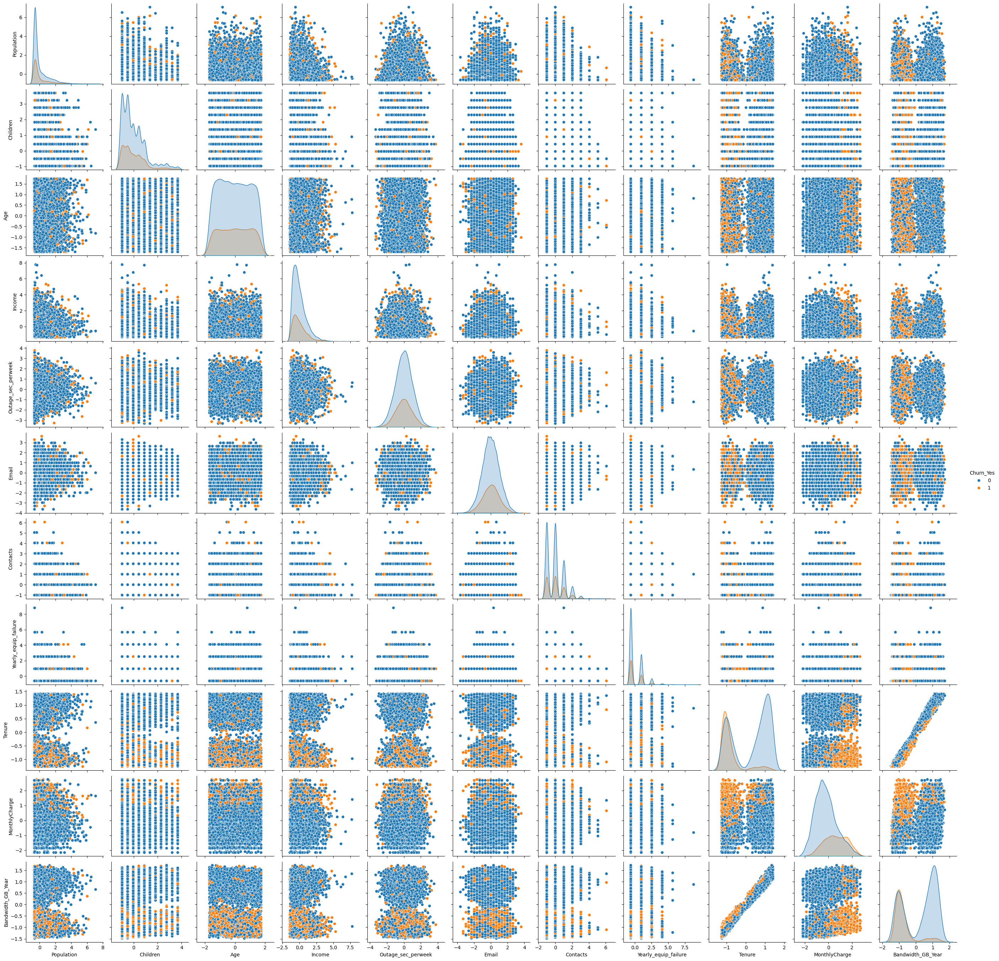

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Churn')  # for small datasets

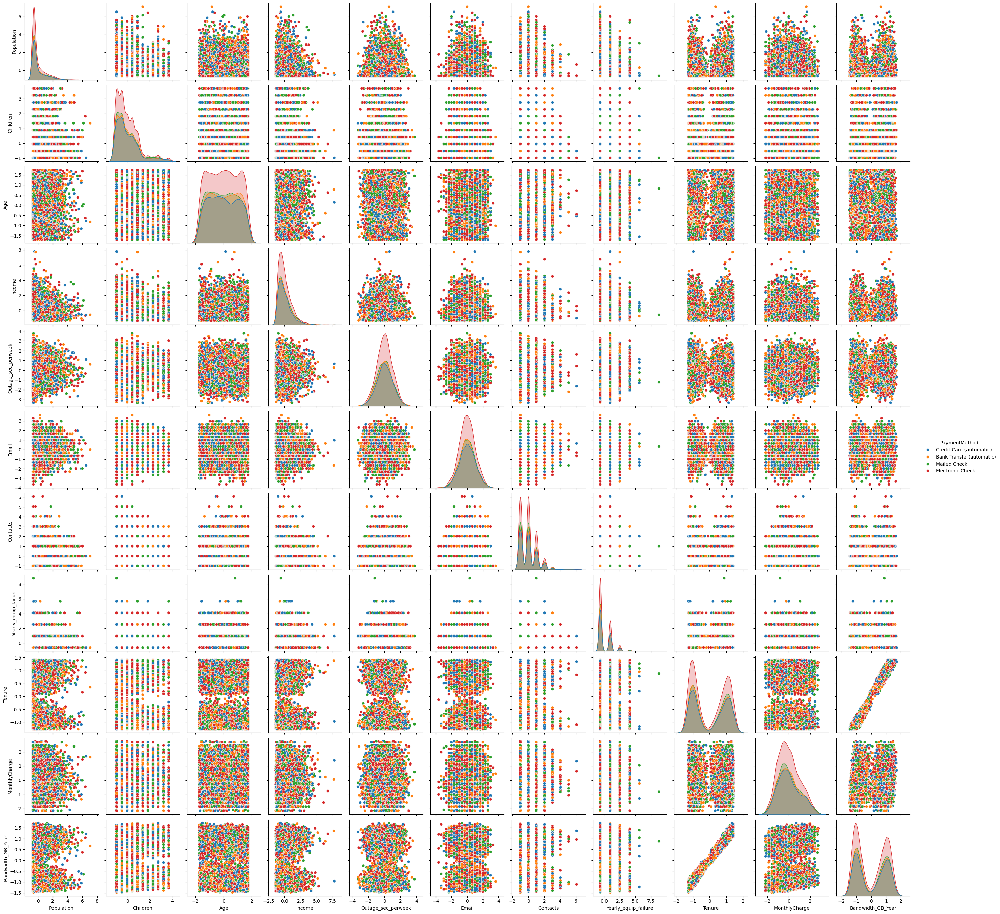

In [52]:
sns.pairplot(df, hue='PaymentMethod')  # for small datasets

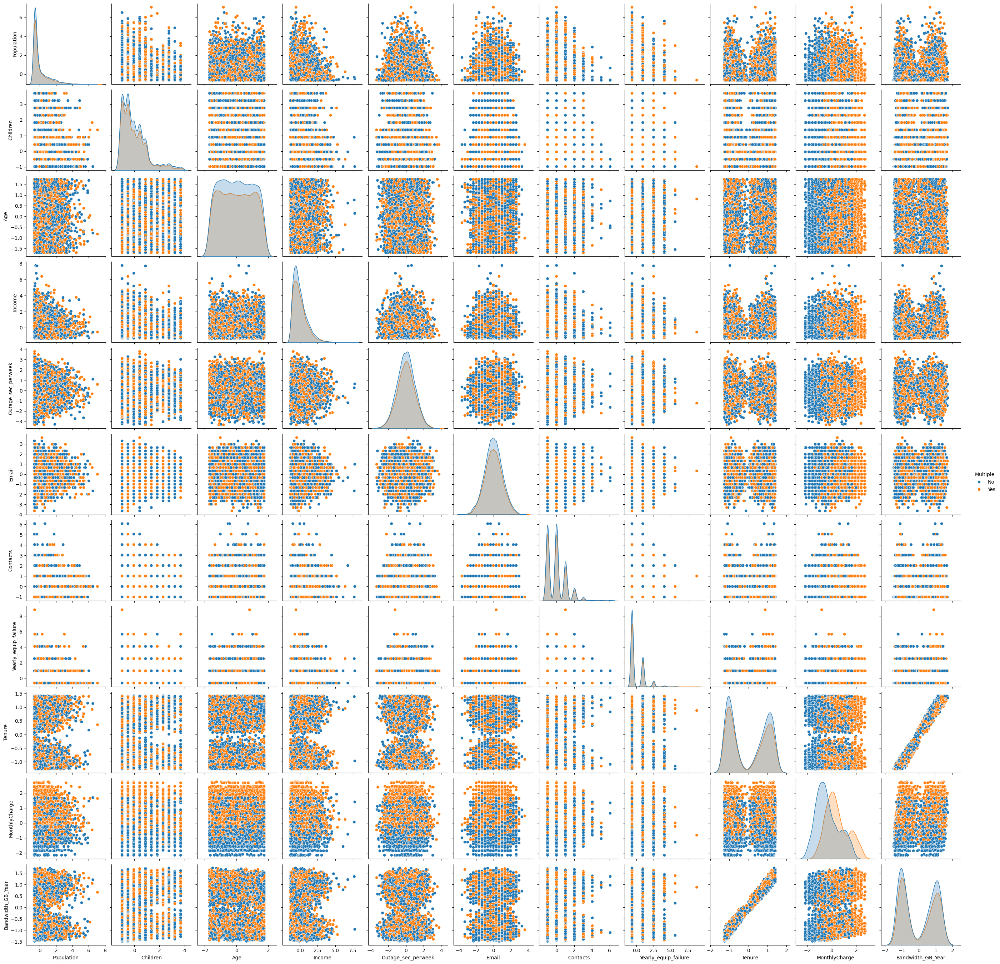

In [68]:
# ['Population', 'Children', 'Age', 'Income', 'Outage_sec_perweek',
#        'Email', 'Contacts', 'Yearly_equip_failure', 'Tenure', 'MonthlyCharge',
#        'Bandwidth_GB_Year', 'State', 'Area', 'Job', 'Marital', 'Gender',
#        'Churn', 'Techie', 'Contract', 'Port_modem', 'Tablet',
#        'InternetService', 'Phone', 'Multiple', 'OnlineSecurity',
#        'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
#        'StreamingMovies', 'PaperlessBilling', 'PaymentMethod']

sns.pairplot(df, hue='Multiple')  # for small datasets

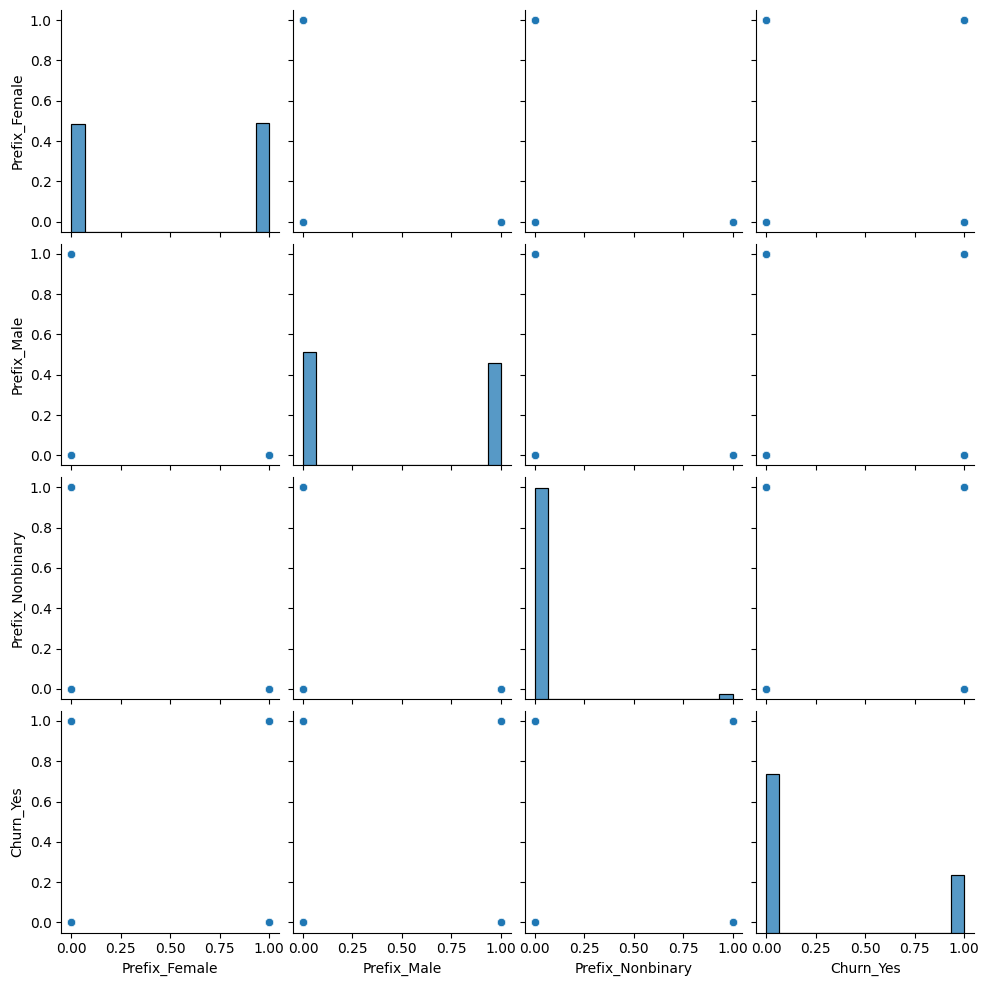

In [42]:
df_encoded = pd.get_dummies(df1['Gender'], prefix='Prefix')
new_df = pd.concat([df_encoded, df['Churn_Yes']], axis=1)
sns.pairplot(new_df)  # for small datasets

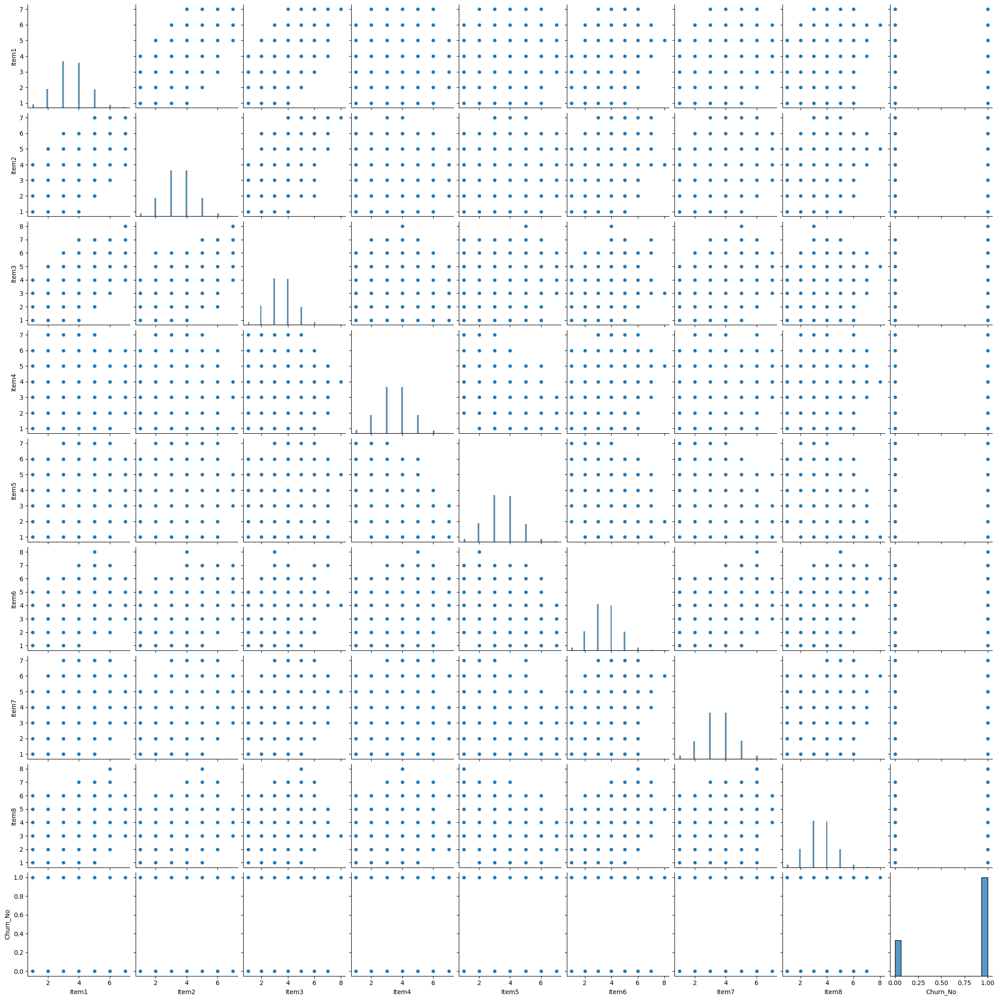

In [18]:
new_df = pd.concat([df['Item1'], df['Item2'], df['Item3'], 
                    df['Item4'], df['Item5'], df['Item6'], df['Item7'], df['Item8'],
                    df['Churn_No']], axis=1)
sns.pairplot(new_df)  # for small datasets